In [4]:
import matplotlib.pyplot as plt
import os
import math
import numpy as np
import pandas as pd
import re

import time
import torch
import torch.nn

import random
import pickle

# import self-defined module
from utils_eval import AverageMeter

In [5]:
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.device(0))
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
0
4
Tesla V100-SXM2-32GB


In [6]:
import torch.backends.cudnn as cudnn
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
else:
    device = torch.device("cpu")
    cudnn.benchmark=False

print(device)
print(torch.cuda.get_device_name(0))

cuda:0
Tesla V100-SXM2-32GB


In [7]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# 1. Load data

### a. Microbiome & metadata (SHOGUN)

In [8]:
### Read SHOGUN microbiome data - Voom-SNM-Quantile-Data
microbiome_shogun = pd.read_csv('./data/SHOGUN-TCGA-Voom-SNM-Quantile-Data-13517-Samples.csv', 
                               header=0, index_col=0)
### Read Metadata
metadata_shogun = pd.read_csv('./data/Metadata-TCGA-SHOGUN-13517-Samples.csv', 
                               header=0, index_col=0)

#### Merge microbime data and metadata

In [9]:
metadata_subset = metadata_shogun[['case_uuid', 'sample_uuid', 'experimental_strategy', 'sample_type']]
microbiome_metadata_shogun_df = pd.merge(left=microbiome_shogun, right=metadata_subset, how='left', 
                                         left_index=True, right_index=True)
microbiome_metadata_shogun_df['sample_uuid'] = [microbiome_metadata_shogun_df['sample_uuid'].values[i].lower() \
                                                for i in range(microbiome_metadata_shogun_df.shape[0])]

### b. Immune variables

In [10]:
### Read clinical varaible data
clinical_immune_variables_df = pd.read_excel('./data/Master Table-Alteration in CNV, Mut, Pathway .xlsx', sheet_name='Clinical variables', 
                                             header=0, index_col=1, 
                                             na_values=['[Not Applicable]', '#N/A', '[Not Available]', 
                                                        '[Discrepancy]', '[Not Evaluated]', '[Unknown]'])

# Remove duplicate columns
import re
for c in clinical_immune_variables_df.columns:
    if re.search('.*[.]\d', c):
        clinical_immune_variables_df = clinical_immune_variables_df.drop(columns = [c])
clinical_immune_variables_df = clinical_immune_variables_df.drop(columns = ['OS Time', 'OS.time (months)', 'OS', 
                                                                            'PFI Time', 'DSS.time (days)'])

# Pick out immune variables
imune_check_df = pd.read_csv('./data/immune_check_df.csv', header=0, index_col=0)
immune_variables_names = imune_check_df['features'].loc[imune_check_df['immune feature (1/0)'] == 1].values
immune_variables_df = clinical_immune_variables_df.loc[:, immune_variables_names]
immune_variables_df = pd.concat([clinical_immune_variables_df[['PATIENT_BARCODE', 'DISEASE']], 
                                 immune_variables_df], axis=1)

In [11]:
immune_variables_df

,PATIENT_BARCODE,DISEASE,HLA-A1,HLA-A2,homo HLA-A =1,HLA-B1,HLA-B2,homo HLA-B =1,HLA-C1,HLA-C2,...,T Cells CD4 Memory Resting,T Cells CD4 Naive,T Cells CD8,T Cells Follicular Helper,T Cells gamma delta,T Cells Regulatory Tregs,Lymphocytes,Mast Cells,Dendritic Cells,Macrophages
SAMPLE_BARCODE,,,,,,,,,,,,,,,,,,,,,
TCGA-OR-A5J1-01,TCGA-OR-A5J1,ACC,hla_a_03_01_01_01,hla_a_02_01_01_01,0.0,hla_b_07_02_01,hla_b_35_01_01_02,0.0,hla_c_12_03_01_01,hla_c_04_01_01_01,...,0.271379,0.000000,0.135295,0.000550,0.0,0.000000,0.504445,0.113973,0.020279,0.361304
TCGA-OR-A5J2-01,TCGA-OR-A5J2,ACC,hla_a_03_01_01_01,hla_a_33_01_01,0.0,hla_b_14_02_01,hla_b_08_01_01,0.0,hla_c_07_01_01_01,hla_c_08_02_01,...,0.138389,0.000000,0.113243,0.010731,0.0,0.000000,0.442393,0.000000,0.049605,0.508002
TCGA-OR-A5J3-01,TCGA-OR-A5J3,ACC,hla_a_23_01_01,hla_a_31_01_02,0.0,hla_b_55_01_01,hla_b_15_05_01,0.0,hla_c_01_02_01,hla_c_01_02_01,...,0.110013,0.143165,0.017344,0.000000,0.0,0.000000,0.456039,0.084546,0.156533,0.302882
TCGA-OR-A5J5-01,TCGA-OR-A5J5,ACC,hla_a_24_02_01_01,hla_a_23_01_01,0.0,hla_b_35_01_01_02,hla_b_40_01_02,0.0,hla_c_03_04_01_01,hla_c_04_01_01_01,...,0.165923,0.009546,0.061211,0.000000,0.0,0.000000,0.409311,0.028120,0.018774,0.543795
TCGA-OR-A5J6-01,TCGA-OR-A5J6,ACC,hla_a_03_01_01_01,hla_a_33_01_01,0.0,hla_b_14_02_01,hla_b_15_10_01,0.0,hla_c_08_02_01,hla_c_03_04_02,...,0.134203,0.000000,0.053699,0.001461,0.0,0.000000,0.218803,0.096331,0.015021,0.666090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-YZ-A980-01,TCGA-YZ-A980,UVM,hla_a_24_02_01_01,hla_a_23_01_01,0.0,hla_b_07_02_01,hla_b_18_01_01_01,0.0,hla_c_07_02_01_03,hla_c_05_01_01_01,...,0.011387,0.000000,0.131042,0.109982,0.0,0.003538,0.349903,0.048025,0.000000,0.602072
TCGA-YZ-A982-01,TCGA-YZ-A982,UVM,hla_a_03_01_01_01,hla_a_01_01_01_01,0.0,hla_b_51_01_01,hla_b_44_02_01_01,0.0,hla_c_15_02_01,hla_c_05_01_01_02,...,0.069677,0.000000,0.020880,0.025424,0.0,0.024915,0.260535,0.132749,0.002590,0.604126
TCGA-YZ-A983-01,TCGA-YZ-A983,UVM,hla_a_11_01_01,hla_a_24_02_01_01,0.0,hla_b_18_03,hla_b_35_01_01_02,0.0,hla_c_07_01_01_01,hla_c_04_01_01_05,...,0.063108,0.000000,0.030245,0.000578,0.0,0.001941,0.313487,0.295331,0.003421,0.387761


In [12]:
microbiome_metadata_shogun_df

,k__Archaea.p__Crenarchaeota.c__Thermoprotei.o__Sulfolobales.f__Sulfolobaceae.g__Sulfolobus,k__Archaea.p__Euryarchaeota.c__Thermoplasmata.o__Thermoplasmatales.f__Ferroplasmaceae.g__Acidiplasma,k__Bacteria.__.__.__.__.__,k__Bacteria.p__.c__.o__.f__.g__,k__Bacteria.p__Actinobacteria.__.__.__.__,k__Bacteria.p__Actinobacteria.c__Actinobacteria.__.__.__,k__Bacteria.p__Actinobacteria.c__Actinobacteria.o__Actinomycetales.f__Actinomycetaceae.g__Actinomyces,k__Bacteria.p__Actinobacteria.c__Actinobacteria.o__Bifidobacteriales.f__Bifidobacteriaceae.__,k__Bacteria.p__Actinobacteria.c__Actinobacteria.o__Bifidobacteriales.f__Bifidobacteriaceae.g__Bifidobacterium,k__Bacteria.p__Actinobacteria.c__Actinobacteria.o__Corynebacteriales.__.__,...,k__Bacteria.p__Actinobacteria.c__Actinobacteria.o__Kineosporiales.f__Kineosporiaceae.g__Kineosporia,k__Bacteria.p__Cyanobacteria.c__.o__Chroococcales.f__Cyanobacteriaceae.g__Cyanobacterium,k__Bacteria.p__Cyanobacteria.c__.o__Nostocales.f__Aphanizomenonaceae.g__Sphaerospermopsis,k__Bacteria.p__Cyanobacteria.c__.o__Nostocales.f__Symphyonemataceae.g__Mastigocladopsis,k__Bacteria.p__Proteobacteria.c__Alphaproteobacteria.o__Holosporales.f__Holosporaceae.g__,k__Bacteria.p__Proteobacteria.c__Alphaproteobacteria.o__Rickettsiales.f__Candidatus.Midichloriaceae.g__Candidatus.Jidaibacter,case_uuid,sample_uuid,experimental_strategy,sample_type
s159,-0.465401,6.508585,20.285959,4.731833,-1.465741,1.164110,-1.351015,-1.133931,-1.188310,3.663757,...,-1.076197,-1.077234,-1.080953,-1.077257,-1.076246,-1.076238,1ae9cd13-73ef-4b1a-a734-4c465c73bc8e,e346de66-4edb-44eb-b363-3c02beac8635,RNA-Seq,Primary Tumor
s150,11.036542,12.018787,20.285959,4.731833,-1.465741,5.906890,-1.351015,-1.133931,-1.188310,3.663757,...,-1.076197,-1.077234,-1.080953,-1.077257,-1.076246,-1.076238,9ec86c06-e7a9-4ea6-b36d-6f832909054b,0be64816-8299-49b2-b96c-cd0f4da7d37b,RNA-Seq,Primary Tumor
s160,10.735982,6.508585,18.048346,4.731833,-1.465741,12.082898,-1.351015,-1.133931,-1.188310,3.663757,...,-1.076197,-1.077234,-1.080953,-1.077257,-1.076246,-1.076238,0b73cbba-5520-4610-b649-912d76114033,1a580a44-6d1a-4df5-8df5-f6bb0b328e68,RNA-Seq,Primary Tumor
s173,4.277380,6.508585,18.048346,4.731833,-1.465741,3.825241,-1.351015,-1.133931,-1.188310,3.663757,...,-1.076197,-1.077234,-1.080953,-1.077257,-1.076246,-1.076238,cf327482-199b-4604-ac19-c8b68d91c5d9,f9c01615-0645-4d26-84e4-c5d55d9c9566,RNA-Seq,Primary Tumor
s106,8.872817,14.158892,20.285959,4.731833,-1.465741,12.966648,-1.351015,-1.133931,-1.188310,3.663757,...,-1.076197,-1.077234,-1.080953,-1.077257,-1.076246,-1.076238,a9a57127-94d3-425f-a4c5-5cbcf24a9a35,fc7aa029-f103-41fb-add3-dd6070a13daf,RNA-Seq,Primary Tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s205,11.751580,11.842400,19.950120,5.209011,-1.163423,8.667341,-1.308536,-1.076835,-1.034778,4.258391,...,-1.076088,-1.077190,-1.080749,-1.077213,-1.076240,-1.076235,a18d3ba3-e2f4-4144-9c25-2019cad193f4,d1bbfd38-9e8a-43cb-8380-2acb524088d1,WGS,Blood Derived Normal
s260,11.090010,11.997960,20.731470,5.231098,-1.144627,8.418844,-1.307928,-1.073912,-1.036365,4.190031,...,-1.076074,-1.077188,-1.080740,-1.077211,-1.076239,-1.076234,6103e640-8b62-4e39-908b-b62a0debeb0e,1b626599-ec44-409d-8123-ed69d8442c19,WGS,Primary Tumor
s198,12.598790,11.842400,19.102910,5.209011,-1.163423,8.667341,-1.308536,-1.076835,-1.034778,4.258391,...,-1.076088,-1.077190,-1.080749,-1.077213,-1.076240,-1.076235,eeab0529-31e6-4edb-bd2c-a21f2a169381,dbd5162b-09fb-4909-8f38-6e0e94fcfd62,WGS,Blood Derived Normal
s317,14.570110,14.708940,20.232590,5.019191,-1.338791,3.662177,-1.281067,-1.108519,-1.011772,3.556629,...,-1.076199,-1.077197,-1.080779,-1.077219,-1.076247,-1.076239,014d4b17-d683-438b-9287-33fcec82bf5a,a1daa8ee-3755-4cc7-b2e5-fcd220792916,RNA-Seq,Primary Tumor


In [17]:
np.unique(immune_variables_df['DISEASE']).shape

(33,)

# 2. Process and merge data

In [13]:
def remove_missing_rows(dataset, microbiome_column_index):
    start_idx = microbiome_column_index[0]
    end_idx = microbiome_column_index[1]
    
    na_idx = np.where(pd.isna(dataset.iloc[:,start_idx:end_idx]).sum(axis=1)==(end_idx-start_idx))[0]
    dataset_nona = dataset.drop(dataset.index[na_idx], axis=0)
    return dataset_nona

In [14]:
def subsetting(dataset, columns, remain_value_list):
    for column, remain_value in zip(columns, remain_value_list):
        idx_remain = np.isin(dataset.loc[:, column], remain_value)
        dataset = dataset.loc[idx_remain, :]
    return dataset

In [15]:
def merge_immune_microbiome(disease, immune_variables_df, microbiome_metadata_shogun_df, 
                              subsetting_columns=['sample_type', 'experimental_strategy'], 
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']]):
    
    
    ### Read immune data
    immune_variables_df_disease = immune_variables_df.loc[immune_variables_df['DISEASE'] == disease,:]
    import re
    na_col_idx = np.where([re.search('Unnamed.*', immune_variables_df_disease.columns[i]) 
                          for i in range(immune_variables_df_disease.shape[1])])
    rm_col_name = ['type','order in TCGA immune data table', 'patientBarcode', 'bcr_patient_barcode',
                  'barcode', 'TCGA Participant Barcode', 'TCGA Study']
    rm_col_name = list(set(rm_col_name) & set(immune_variables_df_disease.columns))

    immune_variables_df_disease = immune_variables_df_disease.\
        drop(columns=list(immune_variables_df_disease.columns[na_col_idx]) + rm_col_name)
    
    print('========================================================================')
    print(disease.upper())
    print('< immune Variables >')
    print('Total sample #:', immune_variables_df_disease.shape[0])
    print('Unique patient #:', len(np.unique(immune_variables_df_disease['PATIENT_BARCODE'])))

    ### Biospecimen data

    ### Read biospecimen data from GDC data portal 
    ### Reference: https://www.biostars.org/p/200546/
    import json

    fileName='./data/biospecimen.project-TCGA-{}.2021-10-14.json'.format(disease)

    with open(fileName) as data_file:    
        biospecimen = json.load(data_file)

    id_list = []
    for i in range(len(biospecimen)):
        for j in range(len(biospecimen[i]['samples'])):
            id_list.append([biospecimen[i]['case_id'], biospecimen[i]['samples'][j]['submitter_id'],
                           biospecimen[i]['samples'][j]['sample_id'], biospecimen[i]['samples'][j]['is_ffpe'],
                           biospecimen[i]['samples'][j]['sample_type']])
    id_df = pd.DataFrame(id_list, columns=['case_uuid', 'sample_id', 'sample_uuid', 'is_ffpe', 'sample_type_bs'])
    id_df = id_df.sort_values(by=['sample_id'])
    id_df['sample_id'] = [id_df['sample_id'].values[i][:-1] for i in range(id_df.shape[0])]
    id_df = id_df.drop_duplicates(subset=['sample_id'])

    print('< biospecimen data >')
    print('Biospecimen sample #:', id_df.shape[0])
    print('sample_type_bs:', list(np.unique(id_df['sample_type_bs'])))

    #### Merge mutation/CNV OR immune data with biospecimen data and microbiome data

    immune_variables_df_disease_uuid = pd.merge(left=immune_variables_df_disease, right=id_df, 
                                               how='left', left_index=True, right_on='sample_id')
    immune_variables_df_disease_microbiome = pd.merge(left=immune_variables_df_disease_uuid, 
                                                     right=microbiome_metadata_shogun_df,
                                                     how='left', on='sample_uuid')
    immune_variables_df_disease_microbiome.index = immune_variables_df_disease_microbiome['sample_id']
    
    ### Remove rows with no corresponding microbiome data
    microbiome_column_index = [immune_variables_df_disease_uuid.shape[1], 
                               immune_variables_df_disease_microbiome.shape[1]-3]
    immune_variables_df_disease_microbiome_nona = remove_missing_rows(immune_variables_df_disease_microbiome, 
                                                                     microbiome_column_index)
    immune_variables_df_disease_microbiome_clean = subsetting(immune_variables_df_disease_microbiome_nona, 
                                                    subsetting_columns, remain_value_list)
    immune_variables_df_disease_microbiome_clean.drop_duplicates(subset='sample_id', inplace=True)
    microbiome_clean = immune_variables_df_disease_microbiome_clean.iloc[:, microbiome_column_index[0]:microbiome_column_index[1]]
    print('< Merged data >')
    print('Merged data shape:', immune_variables_df_disease_microbiome_clean.shape)
    print('Microbiome data shape:', microbiome_clean.shape)
    print('sample_type:', list(np.unique(immune_variables_df_disease_microbiome_clean['sample_type'])))
    
    ### Saving data
    import os
    os.makedirs('./data/processed data', exist_ok=True)
    immune_variables_df_disease_microbiome_clean.\
        to_pickle('./data/processed data/{}_immune_variables_disease_microbiome_clean.pkl'.format(disease))
    microbiome_clean.\
        to_pickle('./data/processed data/{}_microbiome_clean.pkl'.format(disease))

    return immune_variables_df_disease_microbiome_clean, microbiome_clean


In [13]:
COAD_immune_variables_disease_microbiome_clean, COAD_microbiome_clean = \
    merge_immune_microbiome(disease='COAD', immune_variables_df=immune_variables_df,
                              microbiome_metadata_shogun_df=microbiome_metadata_shogun_df,
                              remain_value_list=[['Metastatic', 'Primary Tumor', 'Recurrent Tumor'], ['RNA-Seq']])
STAD_immune_variables_disease_microbiome_clean, STAD_microbiome_clean = \
    merge_immune_microbiome(disease='STAD', immune_variables_df=immune_variables_df,
                              microbiome_metadata_shogun_df=microbiome_metadata_shogun_df,
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']])

COAD
< immune Variables >
Total sample #: 341
Unique patient #: 341
< biospecimen data >
Biospecimen sample #: 978
sample_type_bs: ['Blood Derived Normal', 'Metastatic', 'Primary Tumor', 'Recurrent Tumor', 'Solid Tissue Normal']
< Merged data >
Merged data shape: (164, 1659)
Microbiome data shape: (164, 1594)
sample_type: ['Primary Tumor']
STAD
< immune Variables >
Total sample #: 383
Unique patient #: 383
< biospecimen data >
Biospecimen sample #: 940
sample_type_bs: ['Blood Derived Normal', 'Primary Tumor', 'Solid Tissue Normal']
< Merged data >
Merged data shape: (380, 1659)
Microbiome data shape: (380, 1594)
sample_type: ['Primary Tumor']


# 3. Prediction by MLPs

In [14]:
### remove nan values
def remove_nan(y):
    nan_idx = np.where(pd.isna(y))[0]
    return y.drop(y.index[nan_idx], axis=0)

In [15]:
### Discretize the continuous variables into 2 or 3 categories - low, (moderate), high
def if_discretize(y_nonan):
    if y_nonan.dtype.name == 'object':
        y_disc = y_nonan
    elif len(np.unique(y_nonan)) <= 6:
        y_disc = y_nonan
    elif np.quantile(y_nonan, 1/2)==np.min(y_nonan):
        y_disc = pd.Series(np.where(y_nonan==np.min(y_nonan), 'Min', 'Not Min'), index=y_nonan.index)
    elif np.quantile(y_nonan, 1/2)==np.max(y_nonan):
        y_disc = pd.Series(np.where(y_nonan==np.max(y_nonan), 'Not Max', 'Max'), index=y_nonan.index)
    elif np.quantile(y_nonan, 1/3)==np.min(y_nonan) or np.quantile(y_nonan, 2/3)==np.max(y_nonan):
        y_disc = pd.qcut(y_nonan, 2, labels=['Low', 'High'])
    else:
        y_disc = pd.qcut(y_nonan, 3, labels=['Low', 'Moderate', 'High'])
    
    ### remove categories with less than 5 instances (8/2 training/testing split)
    u, c = np.unique(y_disc, return_counts=True)
    idx = np.where(np.isin(y_disc, u[c<5]))
    return y_disc.drop(index=y_disc.index[idx])

In [16]:
def balanced_over_sampling(X, y, random_seed=123):
    np.random.seed(random_seed)
    unique_value, unique_value_counts = np.unique(y, return_counts=True)
    train_class_max = np.max(unique_value_counts)
    train_samples_idx = []
    for i, y_unique in enumerate(unique_value):
        train_one_class_idx = np.where(y==y_unique)[0]
        train_one_sample_idx = np.concatenate([train_one_class_idx,
                                               np.random.choice(train_one_class_idx, 
                                                                size=train_class_max-len(train_one_class_idx), replace=True)])
        train_samples_idx.append(train_one_sample_idx)
    train_balanced_idx = np.random.permutation(np.concatenate(train_samples_idx))
    return X[train_balanced_idx], y[train_balanced_idx]

In [17]:
class Classifier(torch.nn.Module):
    def __init__(self, n_in_features, net_hidden_structure, n_out_features, dropout_rate):
        super(Classifier, self).__init__()
        net_fcs = []
        structure = net_hidden_structure
        net_in_shape = n_in_features
        for i, net_n_hidden_nodes in enumerate(structure):
            net_fcs.append(torch.nn.Linear(net_in_shape, net_n_hidden_nodes))
            net_fcs.append(torch.nn.BatchNorm1d(net_n_hidden_nodes))
            net_fcs.append(torch.nn.ReLU6())
            net_fcs.append(torch.nn.Dropout(p=dropout_rate))
            net_in_shape = net_n_hidden_nodes
        net_fcs.append(torch.nn.Linear(net_in_shape, n_out_features))
        self.net_fcs = torch.nn.ModuleList(net_fcs)
        
    def forward(self, x):
        net_fcs = self.net_fcs
        for net_fc in net_fcs:
            x = net_fc(x)
        return x

In [18]:
from torch.utils.data import Dataset, DataLoader
class Dataset(Dataset):
    """Self-defined dataset."""

    def __init__(self, X, y):
        """
        Args:
            X: microbiome data
            y: response data
        """
        self.X = torch.from_numpy(X).float() if not torch.is_tensor(X) else X.float()
        self.y = torch.LongTensor(y) if not torch.is_tensor(y) else y.long()

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [19]:
# train function
from utils_eval import AverageMeter

def train(epoch, classifier, criterion, optimizer, train_loader, gradient_clip=3, device='cpu'):
    """
    One epoch training
    """
    
    classifier.train()
    losses = AverageMeter()
    
    for batch_idx, (data, target) in enumerate(train_loader):
        batch_size = data.size(0)
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()

        # ===================forward=====================
        outputs = classifier(data)
        loss = criterion(outputs, target)

        # ===================backward=====================
        loss.backward()
        torch.nn.utils.clip_grad_norm_(classifier.parameters(), gradient_clip)
        optimizer.step()
        
        # ===================meters=====================
        losses.update(loss.item(), batch_size)
        loss_return = losses.avg
    
    return loss_return

In [20]:
def train_mlp(X,y, disease, batch_size, n_epoch, gradient_clip, dropout_rate, weight_decay,
              lr=0.001, momentum=0.9, random_state=123, device='cuda:0', print_loss=True,
              save_folder='./'):
    
    import torch
    import torch.nn as nn
    import random
    torch.manual_seed(random_state)
    np.random.seed(random_state)
    random.seed(random_state)
    #torch.set_deterministic(True)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(random_state)
        
    ###
    y_nonan = remove_nan(y)
    y_nonan_disc = if_discretize(y_nonan)
    X_nonan = X.loc[y_nonan_disc.index,:]
    
    ### training, testing split
    from sklearn.model_selection import train_test_split

    X_train, X_test, y_train, y_test = train_test_split(X_nonan, y_nonan_disc, test_size=0.2, 
                                                        random_state=random_state, stratify=y_nonan_disc)
    X_train_balanced, y_train_balanced = balanced_over_sampling(np.array(X_train), np.array(y_train))

    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    le.fit(y_nonan_disc)
    y_train_balanced_le = le.transform(y_train_balanced)
    y_test_le = le.transform(y_test)
    classes = le.classes_
    label_dim = len(classes)

    # train_data = torch.utils.data.TensorDataset(torch.tensor(np.array(X_train, dtype='float32')), torch.LongTensor(y_train_le))
    # test_data = torch.utils.data.TensorDataset(torch.tensor(np.array(X_test, dtype='float32')), torch.LongTensor(y_test_le))

    train_data = Dataset(np.array(X_train_balanced), np.array(y_train_balanced_le))
    test_data = Dataset(np.array(X_test), np.array(y_test_le))
    if X_train_balanced.shape[0]%batch_size==1:
        train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0, drop_last=True)
    else:
        train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0)
    test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=0)

    classifier = Classifier(n_in_features=X.shape[1], net_hidden_structure = [512, 128, 32, 8], 
                            n_out_features=label_dim, dropout_rate=dropout_rate)
    classifier.to(device)
    criterion = nn.CrossEntropyLoss() # nn.CrossEntropyLoss combines log_softmax and NLLLoss
    optimizer = torch.optim.SGD(classifier.parameters(), lr=lr, momentum=momentum, weight_decay = weight_decay)
    
    # =========================
    from utils_eval import AverageMeter
    
    hist = dict()
    hist['train_loss'] = []
    hist['test_loss'] = []

    for epoch in range(n_epoch):
        # Train
        train_loss = train(epoch, classifier, criterion, optimizer, train_loader, gradient_clip=gradient_clip, 
                           device=device)
        hist['train_loss'].append(train_loss)

        # test
        classifier.eval()
        test_losses = AverageMeter()

        with torch.no_grad():
            for idx, (data, target) in enumerate(test_loader):
                batch_size = data.size(0)
                data, target = data.to(device), target.to(device)

                # ===================forward=====================
                outputs = classifier(data)
                test_loss = criterion(outputs, target)
                # ===================meters======================
                test_losses.update(test_loss.item(), batch_size)

            hist['test_loss'].append(test_losses.avg)
        if print_loss:
            print('Epoch {} \ttrain_loss\t{}\ttest_loss\t{}'.format(epoch, train_loss, test_losses.avg))
    
    model_save_path = os.path.join(save_folder, 'models/{}/{}'.format(disease, y.name))
    os.makedirs(model_save_path, exist_ok=True)

    torch.save({
                'epoch': n_epoch,
                'model_state_dict': classifier.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'history': hist
                }, os.path.join(model_save_path, '{}.pth'.format(y_train.name)))
    return classifier, optimizer, hist, X_test, y_test_le, classes, (y_train, y_test)

In [21]:
def plot_loss(hist, disease, y, save_folder='./'):
    
    fig = plt.figure(figsize=(16,8))

    plt.plot(np.arange(len(hist['train_loss'])), hist['train_loss'], 
                 label='Training loss', alpha=0.8)

    plt.plot(np.arange(len(hist['test_loss'])), hist['test_loss'], 
                 label='Testing loss', alpha=0.8)

    plt.xlabel('Epoches', fontsize=20)
    plt.xticks(fontsize=20)
    plt.ylabel('Loss', fontsize=20)
    plt.yticks(fontsize=20)
    plt.title('Loss (Covariate = {})'.format(y.name), fontsize=20)
    plt.legend(fontsize=20)
    plt.show()
    
    figure_save_path = os.path.join(save_folder, 'figures/{}/{}'.format(disease, y.name))
    os.makedirs(figure_save_path, exist_ok=True)
    fig.savefig(os.path.join('./figures/{}/{}/train_val_losses.pdf'.format(disease, y.name)))

In [22]:
def micro_avg_auc(y_test_le, classes, pred_proba):
    from sklearn.metrics import roc_curve, auc
    from sklearn.preprocessing import label_binarize
    
    y_test = label_binarize(classes[y_test_le], classes=classes)
    if y_test.shape[1]==1:
        y_test = np.hstack((1-y_test, y_test))
    y_score = pred_proba.cpu().numpy()
    
    # Compute micro-average ROC curve and ROC area
    fpr, tpr, _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc = auc(fpr, tpr)
    
    return roc_auc

In [23]:
def predict_mlp(classifier, optimizer, X_test, y_test_le, classes, device='cpu'):
    classifier.eval()
    with torch.no_grad():
        prediction = classifier(torch.tensor(np.array(X_test, dtype='float32')).to(device))
        pred_proba = torch.nn.Softmax(dim=1)(prediction)
    y_pred = classes[pred_proba.argmax(axis=1).cpu().numpy()]
    y_test_true = classes[y_test_le]
    
    accuracy = sum(y_pred==y_test_true)/len(y_pred)
    
    from sklearn.metrics import confusion_matrix
    confusion_mat = confusion_matrix(y_test_true, y_pred)
    
    auc_micro_avg = micro_avg_auc(y_test_le, classes, pred_proba)
    
    from sklearn.metrics import roc_auc_score
    y_pred_proba = pred_proba[:,1].cpu().numpy() if pred_proba.shape[1]==2 else pred_proba.cpu().numpy()
    auc_weighted_avg = roc_auc_score(y_test_true, y_pred_proba, multi_class='ovr', average="weighted")
    
    return pred_proba, y_pred, accuracy, confusion_mat, (auc_micro_avg, auc_weighted_avg)
    

In [24]:
def train_mlp_all_cols(disease, nan_percentage_cutoff=0.4, device='cuda:0', save_folder='./'):
    immune_variables_disease_microbiome_clean = \
        pd.read_pickle('./data/processed data/{}_immune_variables_disease_microbiome_clean.pkl'.format(disease))

    X_microbiome = pd.read_pickle('./data/processed data/{}_microbiome_clean.pkl'.format(disease))
    col_idx = immune_variables_disease_microbiome_clean.shape[1] - X_microbiome.shape[1] - 3 - 5
    y_immune_all = immune_variables_disease_microbiome_clean.iloc[:, 2:col_idx]

    ### Remove columns that have >40% (or a preset value) nan values for all samples
    y_immune_all_rmv_idx = np.where(y_immune_all.\
                          apply(lambda x: sum(pd.isna(x))/len(x), axis=0) > nan_percentage_cutoff)[0]
    y_immune_all.drop(columns=y_immune_all.columns[y_immune_all_rmv_idx], inplace=True)

    ### Remove columns with a single response after discretization
    y_1value_idx = y_immune_all.apply(lambda x: len(np.unique(if_discretize(remove_nan(x)))), axis=0)==1
    y_immune_all.drop(columns=y_immune_all.columns[y_1value_idx], inplace=True)
        
    ### Remove columns with < 5 instances after discretization
    y_less5_ins_idx = y_immune_all.apply(lambda y: if_discretize(remove_nan(y)).shape[0] < 5, axis=0)
    y_immune_all.drop(columns=y_immune_all.columns[y_less5_ins_idx], inplace=True)

    accuracy_immune_variables = []
    auc_immune_variables = []
    y_pred_immune_variables = []
    confusion_mat_immune_variables = []
    pred_proba_immune_variables = []
    classes_immune_variables = []
    y_train_test_immune_variables = []
    
    for i in range(y_immune_all.shape[1]):
        classifier, optimizer, hist, X_test, y_test_le, classes, y_train_test = \
            train_mlp(X=X_microbiome, y=y_immune_all.iloc[:,i],
            disease=disease, batch_size=32, n_epoch=1000, device=device,
            gradient_clip=2, dropout_rate=0.4, weight_decay=0.1, 
            print_loss=False, save_folder=save_folder)
        plot_loss(hist, disease, y_immune_all.iloc[:,i], save_folder=save_folder)
        pred_proba, y_pred, accuracy, confusion_mat, auc = predict_mlp(classifier, optimizer, X_test, y_test_le, 
                                                                       classes, device=device)
        accuracy_immune_variables.append(accuracy)
        auc_immune_variables.append(auc)
        y_pred_immune_variables.append(y_pred)
        confusion_mat_immune_variables.append(confusion_mat)
        pred_proba_immune_variables.append(pred_proba)
        classes_immune_variables.append(classes)
        y_train_test_immune_variables.append(y_train_test)

    import os
    result_save_folder = os.path.join(save_folder, 'results/{}'.format(disease))
    os.makedirs(result_save_folder, exist_ok=True)
    
    prediction_result_dict = dict()
    prediction_result_dict['accuracy'] = dict(zip(y_immune_all.columns, accuracy_immune_variables))
    prediction_result_dict['auc'] = dict(zip(y_immune_all.columns, auc_immune_variables))
    prediction_result_dict['y_pred'] = dict(zip(y_immune_all.columns, y_pred_immune_variables))
    prediction_result_dict['confusion_matrix'] = dict(zip(y_immune_all.columns, confusion_mat_immune_variables))
    prediction_result_dict['pred_proba'] = dict(zip(y_immune_all.columns, pred_proba_immune_variables))
    prediction_result_dict['classes'] = dict(zip(y_immune_all.columns, classes_immune_variables))
    prediction_result_dict['y_train_test'] = dict(zip(y_immune_all.columns, y_train_test_immune_variables))

    with open(os.path.join(result_save_folder, '{}_prediction_result_dict.pkl'.format(disease)), 'wb') as f:
        pickle.dump(prediction_result_dict, f)
    
    return prediction_result_dict

### COAD

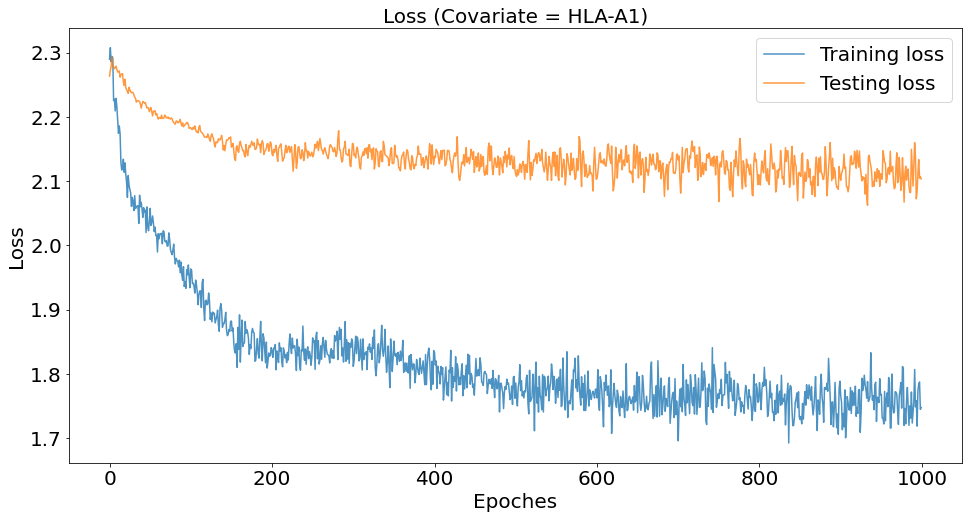

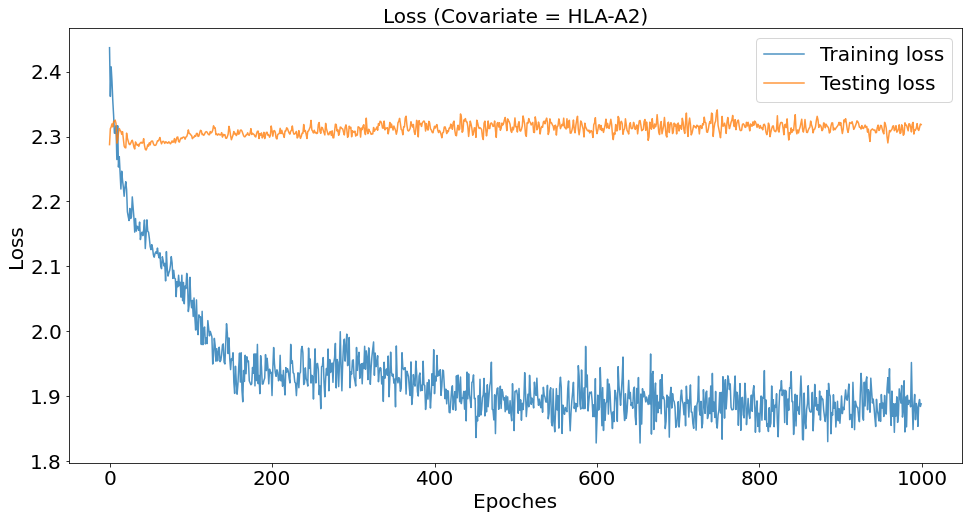

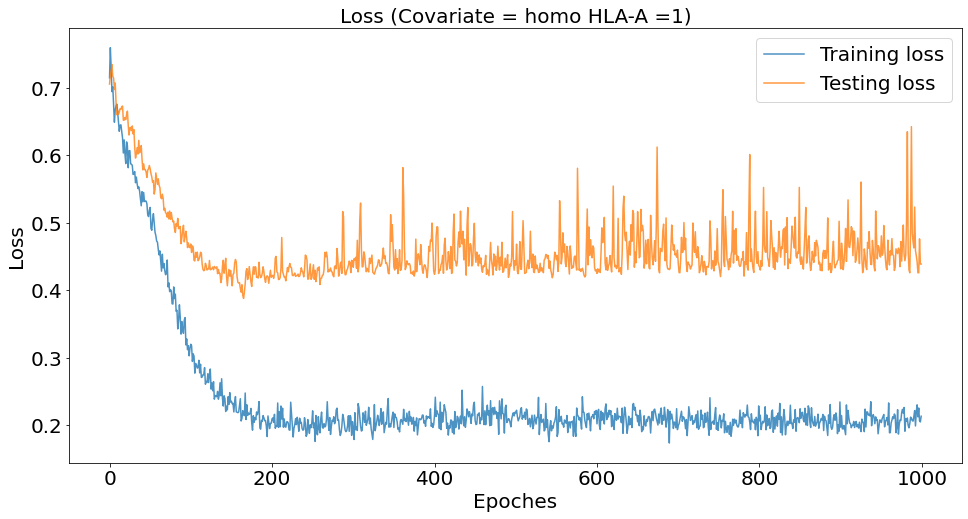

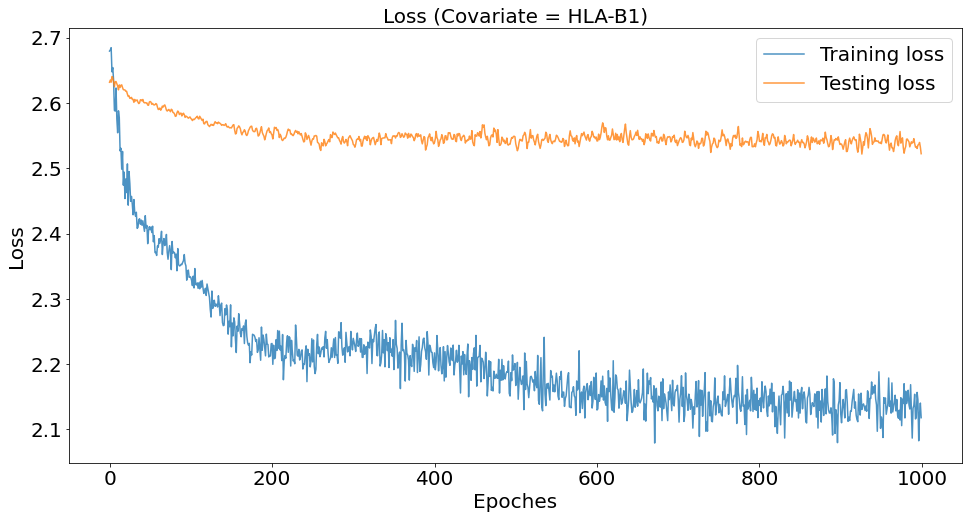

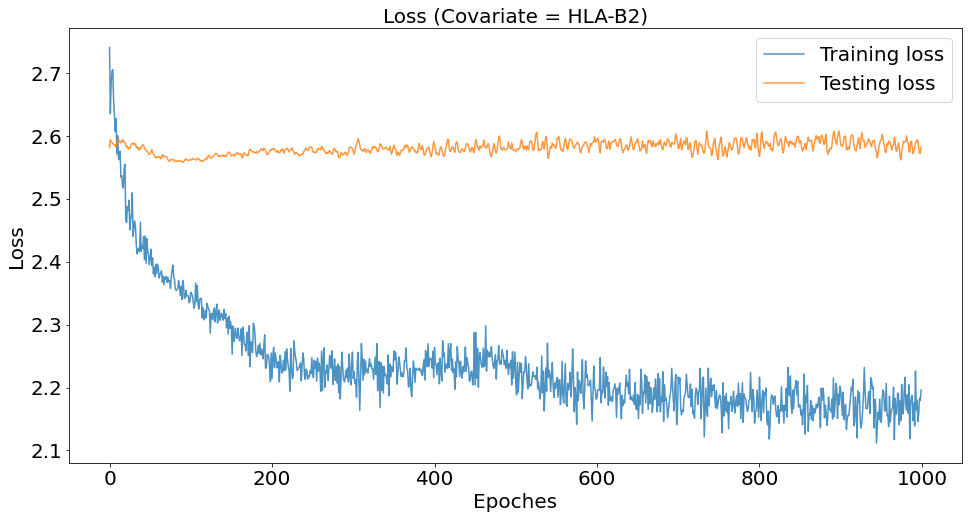

...

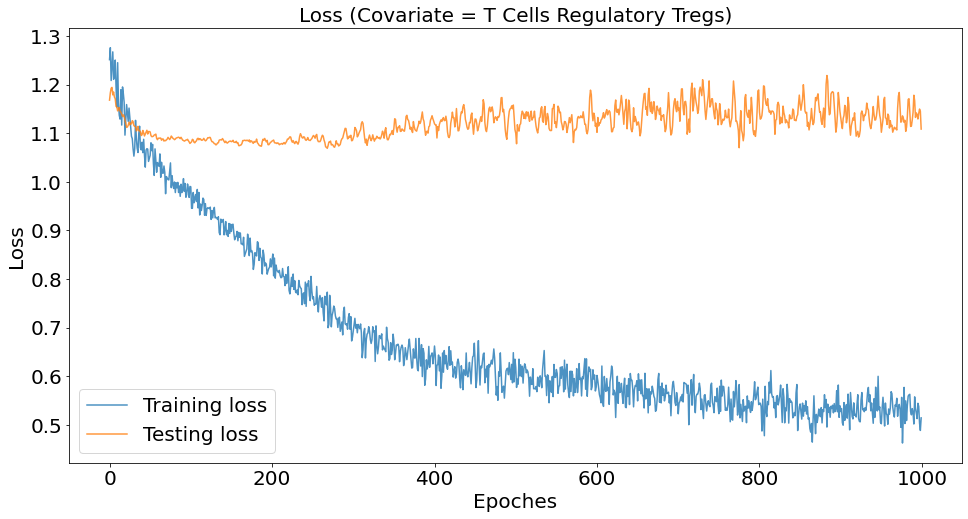

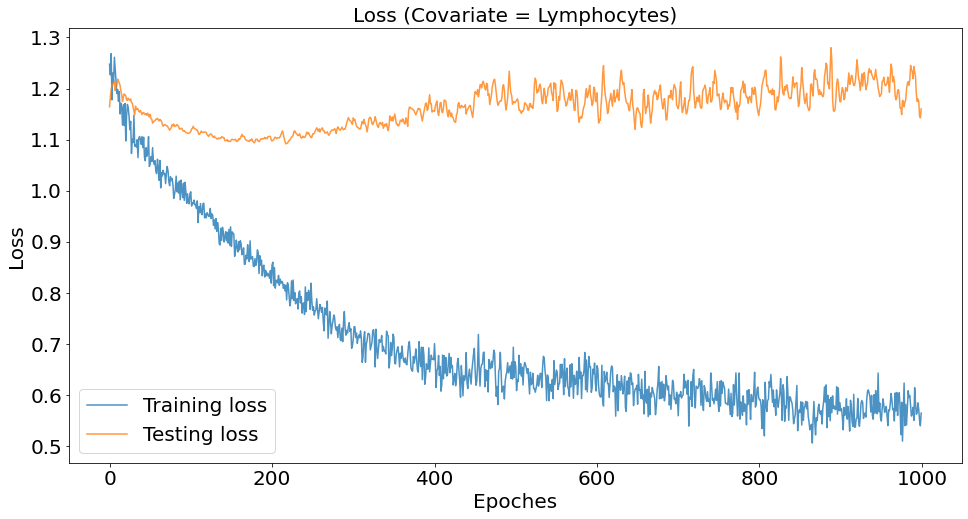

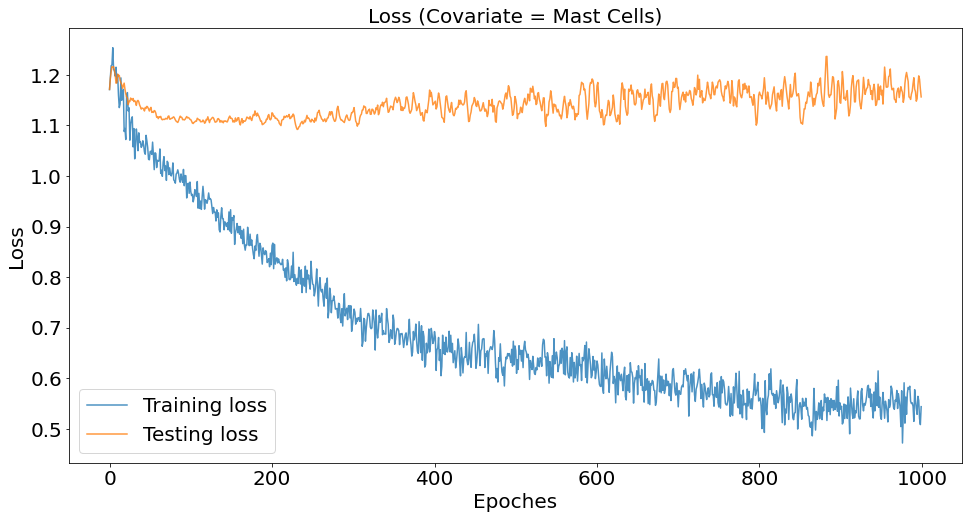

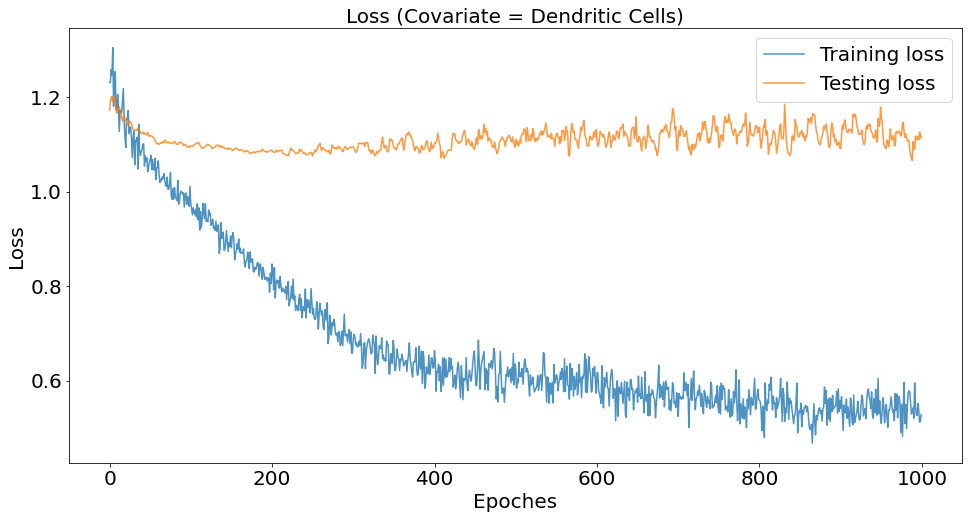

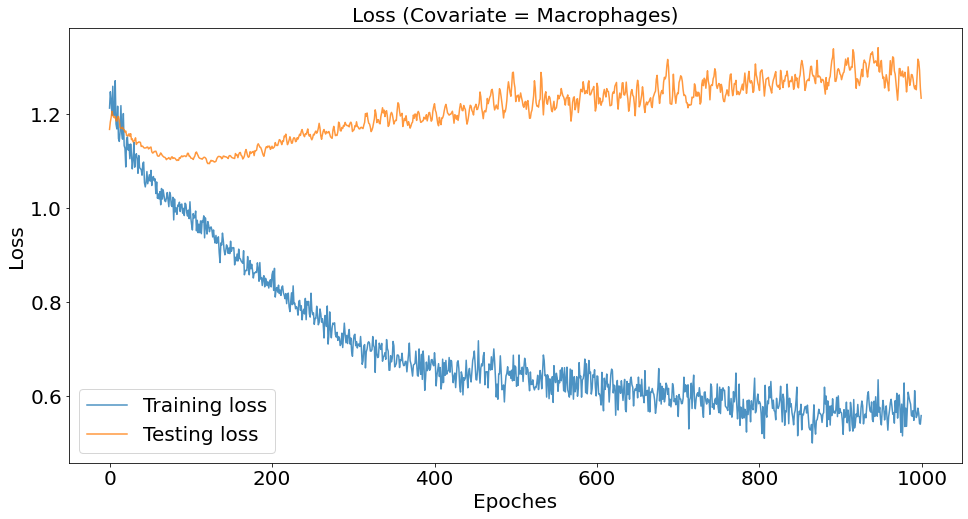

CPU times: user 28min 13s, sys: 1min, total: 29min 13s
Wall time: 23min 18s


In [24]:
%%time
COAD_prediction_result_dict = train_mlp_all_cols('COAD', device=device)

In [25]:
COAD_prediction_result_dict['auc']

{'HLA-A1': (0.6728, 0.5284648642065521),
 'HLA-A2': (0.5522526093275202, 0.4999357283840043),
 'homo HLA-A =1': (0.8246097337006427, 0.49137931034482757),
 'HLA-B1': (0.5814429741650914, 0.5483220956366736),
 'HLA-B2': (0.5148071625344353, 0.5067460317460317),
 'homo HLA-B =1': (0.9485766758494031, 0.6612903225806452),
 'HLA-C1': (0.6232461734693878, 0.6102129533107793),
 'HLA-C2': (0.5521158515435309, 0.5532305827077797),
 'homo HLA-C =1': (0.9843893480257117, 0.9568965517241379),
 'Homozygous in at least one locus = 1': (0.7860422405876952, 0.565),
 'Immune Subtype': (0.6025390625, 0.3314285714285714),
 'Leukocyte Fraction': (0.5853994490358126, 0.6239669421487604),
 'TIL Regional Fraction': (0.5296566077003121, 0.5315668202764978),
 'Macrophage Regulation': (0.6212121212121212, 0.6198347107438016),
 'Lymphocyte Infiltration Signature Score': (0.4292929292929293,
  0.42148760330578516),
 'IFN-gamma Response': (0.5293847566574839, 0.5234159779614326),
 'TGF-beta Response': (0.46051423

In [32]:
len(list(COAD_prediction_result_dict['auc'].keys()))

49

In [26]:
np.sort([x[0] for x in COAD_prediction_result_dict['auc'].values()])[::-1]

array([0.98438935, 0.94857668, 0.9338843 , 0.82460973, 0.78604224,
       0.75298439, 0.68686869, 0.6728    , 0.66391185, 0.6446281 ,
       0.64279155, 0.63728191, 0.62324617, 0.62121212, 0.61799816,
       0.60253906, 0.59871442, 0.59637188, 0.58539945, 0.5835629 ,
       0.58144297, 0.57667585, 0.56473829, 0.56336088, 0.55647383,
       0.55225261, 0.55211585, 0.53810836, 0.52965661, 0.52938476,
       0.52892562, 0.52892562, 0.51480716, 0.50642792, 0.50275482,
       0.50137741, 0.49816345, 0.49773243, 0.48347107, 0.47199265,
       0.46143251, 0.46051423, 0.45867769, 0.44054697, 0.42929293,
       0.41414141, 0.40312213, 0.39072544, 0.37649219])

In [27]:
np.sort([x[1] for x in COAD_prediction_result_dict['auc'].values()])[::-1]

array([0.95689655, 0.74264706, 0.68044077, 0.66129032, 0.63774105,
       0.62396694, 0.62307692, 0.61983471, 0.61021295, 0.6       ,
       0.5952381 , 0.58126722, 0.58126722, 0.58076923, 0.57575758,
       0.57438017, 0.56887052, 0.565     , 0.56198347, 0.55323058,
       0.5483221 , 0.53156682, 0.52892562, 0.52846486, 0.52341598,
       0.5170068 , 0.51470588, 0.5137741 , 0.50674603, 0.50137741,
       0.49993573, 0.49137931, 0.48672211, 0.4862259 , 0.48347107,
       0.48      , 0.47933884, 0.47245179, 0.46831956, 0.46143251,
       0.45353902, 0.4516129 , 0.4214876 , 0.41544118, 0.41203704,
       0.41176471, 0.38292011, 0.37603306, 0.33142857])

### STAD

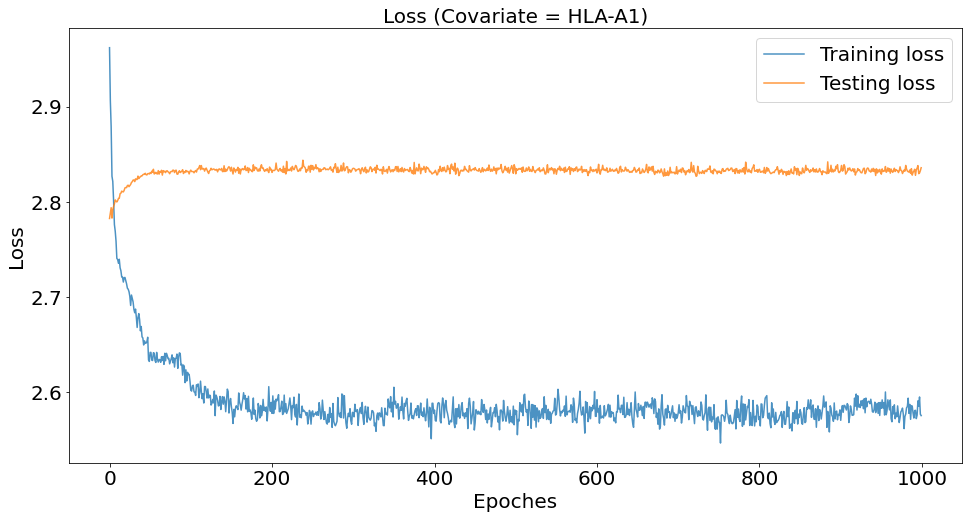

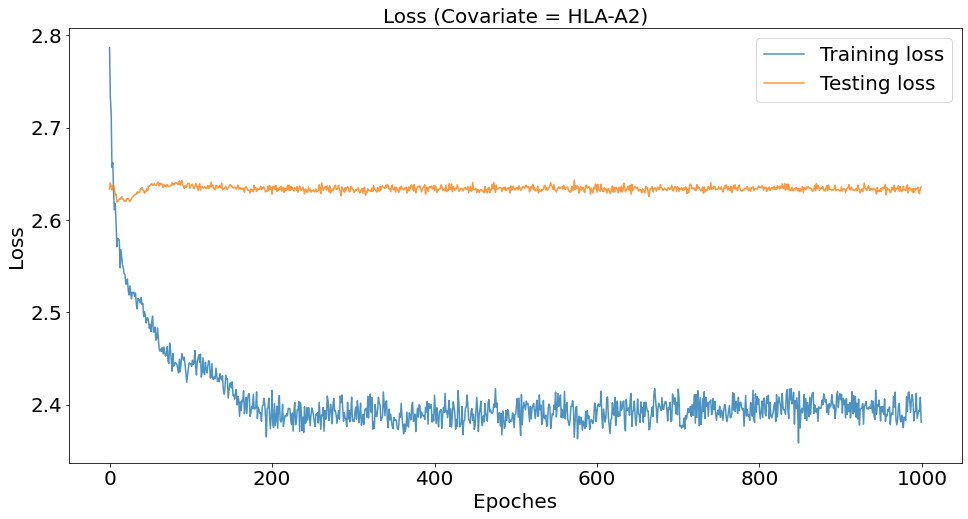

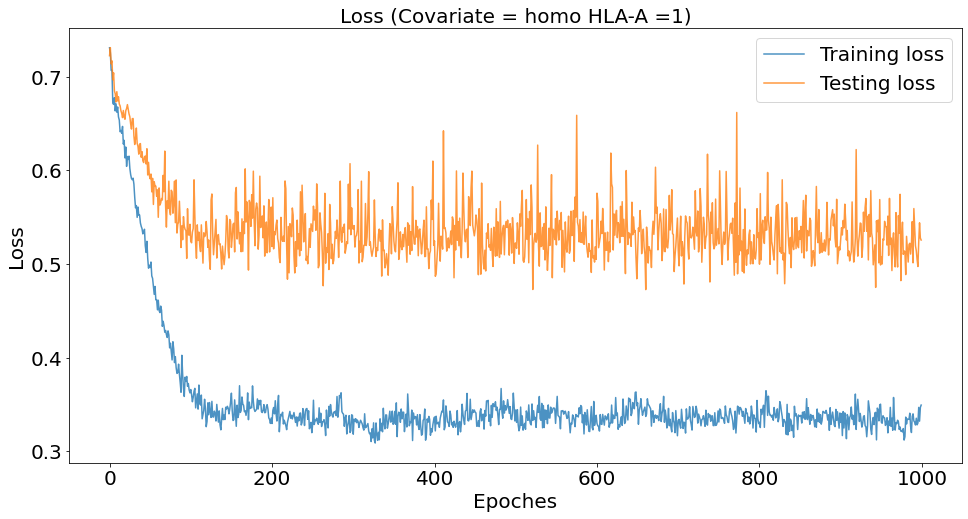

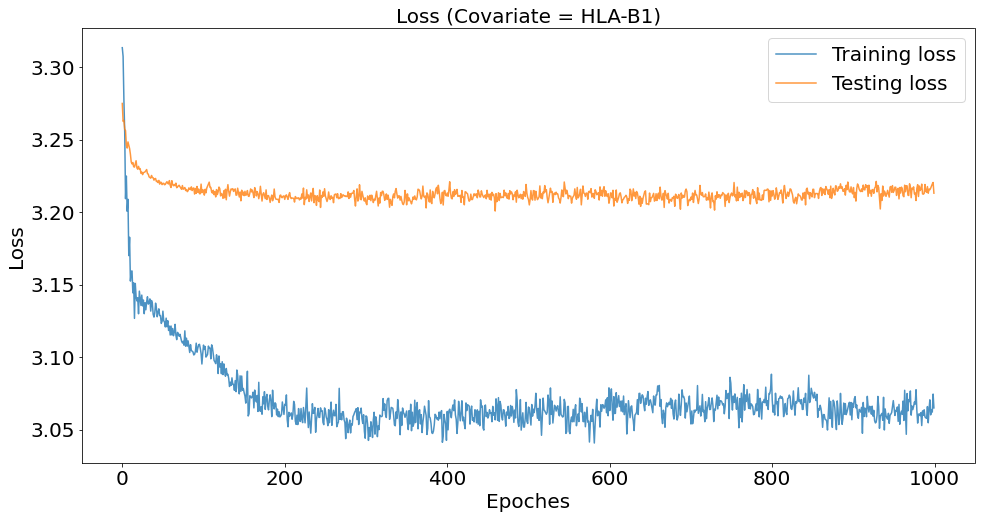

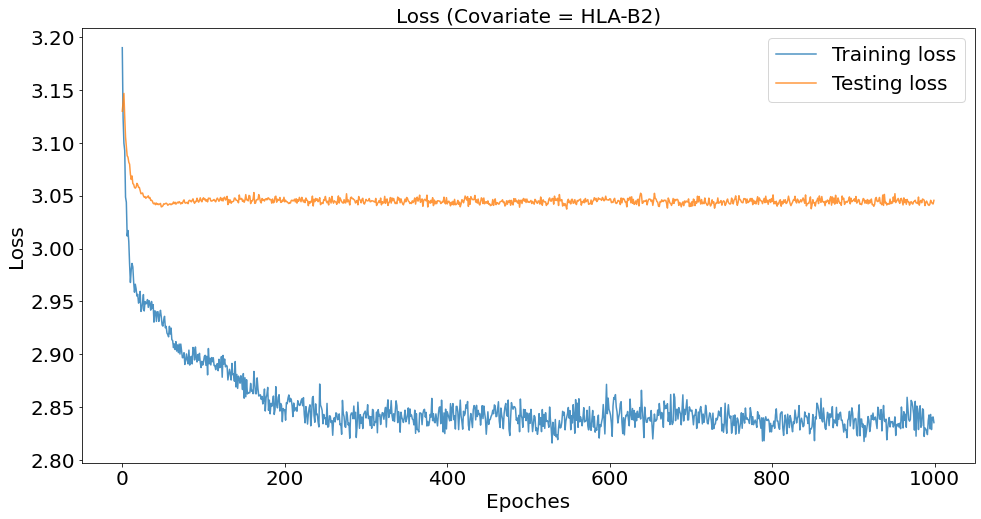

...

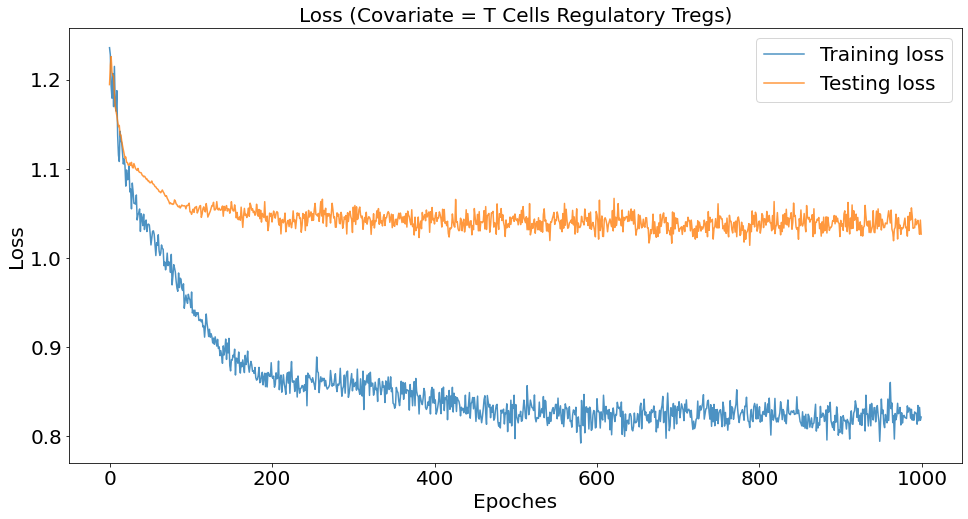

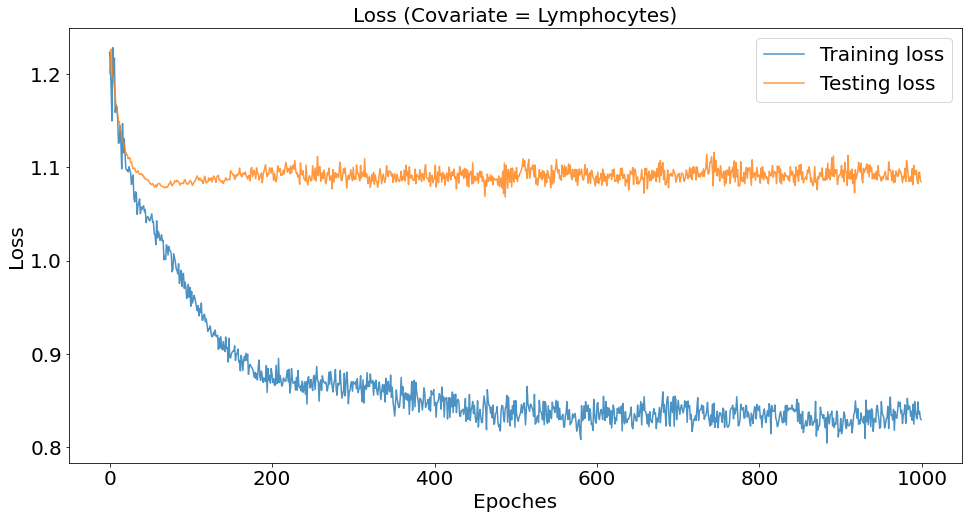

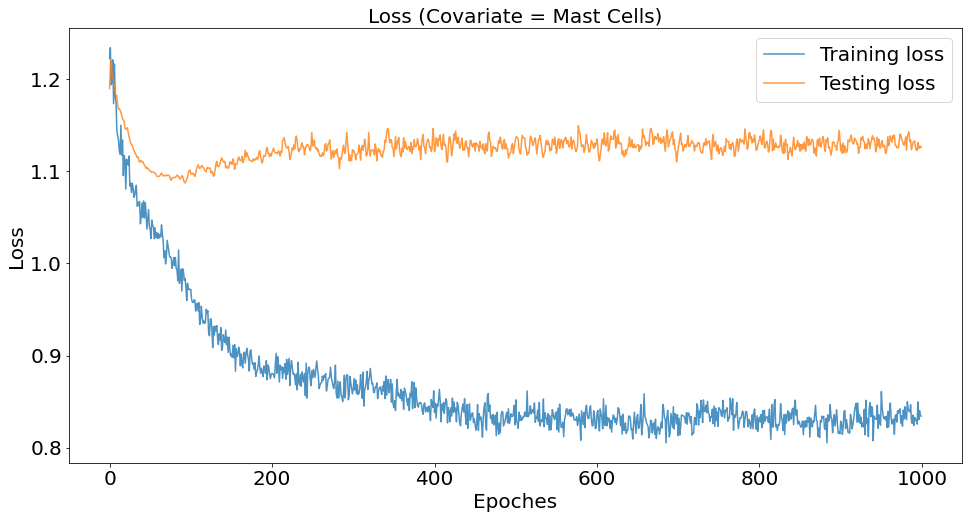

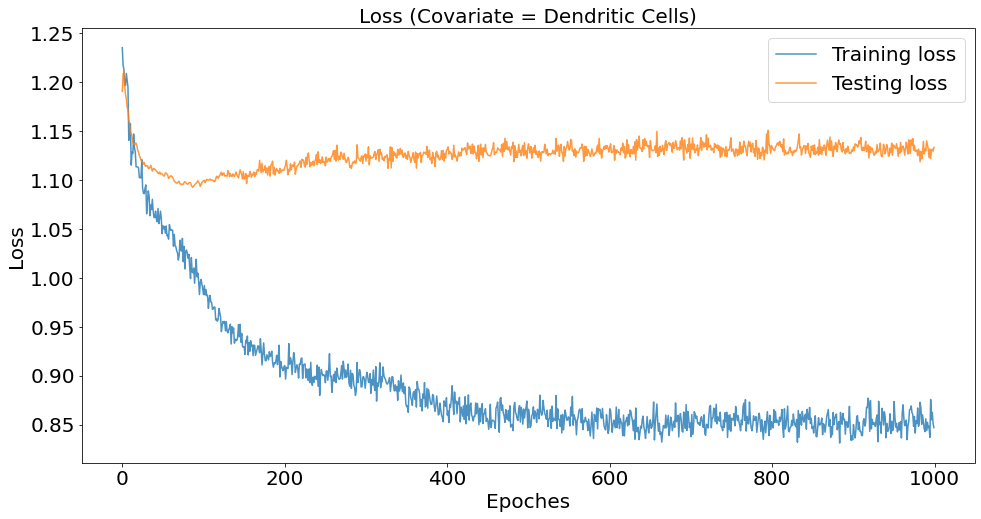

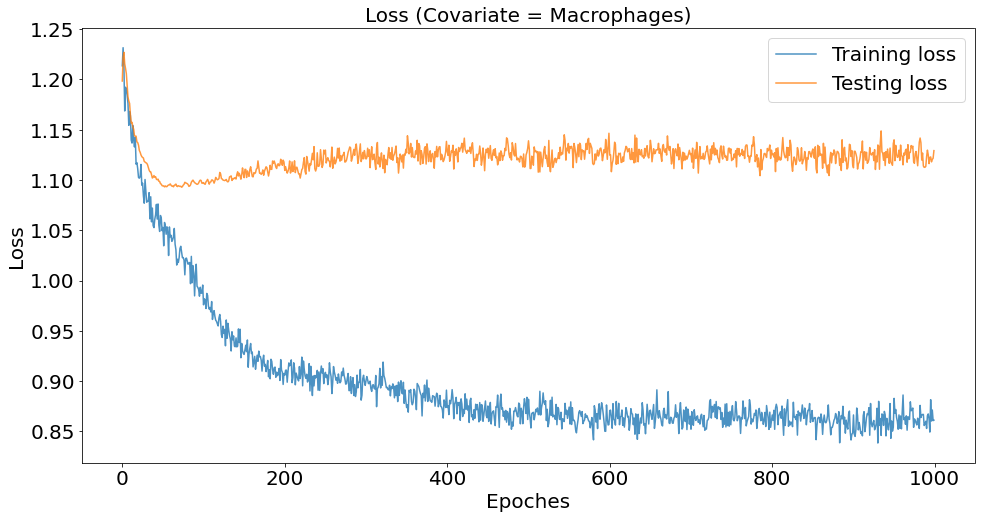

CPU times: user 59min 26s, sys: 1min 24s, total: 1h 50s
Wall time: 54min 8s


In [28]:
%%time
STAD_prediction_result_dict = train_mlp_all_cols('STAD', device=device)

In [29]:
STAD_prediction_result_dict['auc']

{'HLA-A1': (0.5417387543252595, 0.4853152374088174),
 'HLA-A2': (0.535949764521193, 0.5107713884886694),
 'homo HLA-A =1': (0.8112880886426592, 0.6909090909090909),
 'HLA-B1': (0.5760599772135416, 0.547365370768552),
 'HLA-B2': (0.5233611111111112, 0.5128630395611666),
 'homo HLA-B =1': (0.9686634349030471, 0.7802816901408451),
 'HLA-C1': (0.5731568664245581, 0.49553922752626134),
 'HLA-C2': (0.5329365866560867, 0.49119347038169686),
 'homo HLA-C =1': (0.9390581717451523, 0.6915113871635611),
 'Homozygous in at least one locus = 1': (0.6062153739612188,
  0.4925224327018944),
 'Homozygous in all three loci = 1': (0.9963642659279779, 0.8666666666666667),
 'Immune Subtype': (0.7351540858725761, 0.49036123608946336),
 'Leukocyte Fraction': (0.536876731301939, 0.5365583075335397),
 'TIL Regional Fraction': (0.5823039356506751, 0.592025206431986),
 'Macrophage Regulation': (0.5444944598337951, 0.5454076367389061),
 'Lymphocyte Infiltration Signature Score': (0.5579120498614958,
  0.57040763

In [33]:
len(list(STAD_prediction_result_dict['auc'].keys()))

53

In [30]:
np.sort([x[0] for x in STAD_prediction_result_dict['auc'].values()])[::-1]

array([0.99636427, 0.98718837, 0.97662742, 0.96866343, 0.93905817,
       0.90927978, 0.81128809, 0.73515409, 0.7041205 , 0.70106962,
       0.68767313, 0.64785319, 0.64525623, 0.6284626 , 0.61686288,
       0.60621537, 0.59020083, 0.5900277 , 0.58230394, 0.5788608 ,
       0.57652355, 0.57605998, 0.57315687, 0.5719356 , 0.56881925,
       0.56820672, 0.56578947, 0.56146122, 0.56128809, 0.55998961,
       0.55791205, 0.54864958, 0.54596607, 0.54449446, 0.54173875,
       0.53739612, 0.53687673, 0.53594976, 0.53551863, 0.53293659,
       0.53272161, 0.52882618, 0.52336111, 0.51679363, 0.51532202,
       0.51436981, 0.50536704, 0.49679709, 0.48814058, 0.47896468,
       0.45740997, 0.43758657, 0.43109418])

In [31]:
np.sort([x[1] for x in STAD_prediction_result_dict['auc'].values()])[::-1]

array([0.86666667, 0.78028169, 0.72470978, 0.70807534, 0.70368558,
       0.69825784, 0.69151139, 0.69090909, 0.66033024, 0.63374613,
       0.63210227, 0.62603878, 0.6031856 , 0.59202521, 0.58506192,
       0.57785862, 0.57655831, 0.57504644, 0.5720485 , 0.57040764,
       0.56605074, 0.56078431, 0.56074819, 0.55032508, 0.54968288,
       0.54736537, 0.54558308, 0.54540764, 0.54491228, 0.53755102,
       0.53655831, 0.53511352, 0.53116343, 0.52286894, 0.5224355 ,
       0.52219873, 0.52      , 0.51385042, 0.51286304, 0.51266254,
       0.51077139, 0.50863777, 0.49553923, 0.49252243, 0.49119347,
       0.49036124, 0.48663571, 0.48531524, 0.4805676 , 0.45575851,
       0.43853973, 0.42659443, 0.10666667])